# View each single pedestrain trajectory

In [10]:
from skimage import io, filters
import numpy as np
import pandas as pd
from PIL import Image, ImageColor
import matplotlib.patches as mpatches
import pickle
from ipywidgets import interact, Dropdown
import matplotlib.pyplot as plt
from IPython.display import Image as IPImage
import ipywidgets as widgets
import os
from IPython.display import display, clear_output
from IPython.core.display import HTML
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import matplotlib.patches as mpatches
from PIL import Image
from ipywidgets import interact, widgets, interactive_output
from IPython.display import display

In [11]:
import os

# Get the current working directory
current_directory = os.getcwd()

# Get the parent directory
parent_directory = current_directory



In [12]:
with open(parent_directory+'/DATASET/SDD/train_trajnet.pkl', 'rb') as f:
    dataset = pickle.load(f)

In [13]:
def estimate_homography(meters_coords, pixels_coords, num_iterations=100, residual_threshold=1.0):
    assert len(meters_coords) == len(pixels_coords)
    assert len(meters_coords) >= 4

    # Convert coordinates to homogeneous format
    meters_homogeneous = np.column_stack((meters_coords[:, 0], meters_coords[:, 1], np.ones(len(meters_coords))))
    pixels_homogeneous = np.column_stack((pixels_coords[:, 0], pixels_coords[:, 1], np.ones(len(pixels_coords))))

    # Reshape coordinates for OpenCV function
    meters_homogeneous = meters_homogeneous.reshape((-1, 1, 3))
    pixels_homogeneous = pixels_homogeneous.reshape((-1, 1, 3))

    # Estimate homography matrix using RANSAC
    homography_matrix, _ = cv2.findHomography(meters_homogeneous, pixels_homogeneous, cv2.RANSAC, residual_threshold)

    return homography_matrix
def pixels_to_meters(pixel_coords, homography_matrix):
    # Add homogeneous coordinate
    pixel_coords_homogeneous = np.column_stack((pixel_coords, np.ones(len(pixel_coords))))

    # Perform inverse transformation
    meter_coords_homogeneous = np.dot(np.linalg.inv(homography_matrix), pixel_coords_homogeneous.T)
    meter_coords_homogeneous /= meter_coords_homogeneous[2, :]

    # Extract meter coordinates
    meter_coords = meter_coords_homogeneous[:2, :].T
   # meter_coords = np.round(meter_coords_homogeneous[:2, :].T, decimals=1)

    return meter_coords
def c(meter_coords, homography_matrix):
    # Add homogeneous coordinate
    meter_coords_homogeneous = np.column_stack((meter_coords, np.ones(len(meter_coords))))

    # Perform transformation
    pixel_coords_homogeneous = np.dot(homography_matrix, meter_coords_homogeneous.T)
    pixel_coords_homogeneous /= pixel_coords_homogeneous[2, :]

    # Extract pixel coordinates
    pixel_coords = pixel_coords_homogeneous[:2, :].T

    return pixel_coords

In [14]:
import pandas as pd
import numpy as np
from scipy.linalg import svd
import cv2
homography_matrices = {}
with open( parent_directory +'/DATASET/SDD_meter/sdd_meters.pkl', 'rb') as f:
    dataset_meter= pickle.load(f)
    
#print(dataset_meter)
dataset_meter= dataset_meter.sort_values([4,1,0])
dataset_meters = dataset_meter.reset_index(drop=True)
# Group the datasets by scene name
grouped_meters = dataset_meters.groupby(dataset_meters.iloc[:, 4])
grouped_pixels = dataset.groupby(dataset.iloc[:, 4])

# Iterate over the groups and calculate the homogeneous matrix for each scene
for scene_name, group_meters in grouped_meters:
    group_pixels = grouped_pixels.get_group(scene_name)
 #   print(group_pixels )
    group_pixels = group_pixels.sort_values(['trackId','frame'])
 #   print(group_pixels )
    group_meters = grouped_meters.get_group(scene_name)
    group_meters = group_meters.sort_values([1,2])
  #  print(group_meters)
  
   # print(group_meters)
 #   print()
 #   print(group_pixels.iloc[:, [2,3]])
    df = pd.DataFrame({
    'x_meters':  np.array(group_meters.iloc[:, 2]) ,
    'y_meters':  np.array(group_meters.iloc[:, 3]),
    'x_pixels': np.array(group_pixels.iloc[:, 2]),
    'y_pixels': np.array(group_pixels.iloc[:, 3]),
    })
  #  print(df)
#
    # Extract the corresponding points from the DataFrame
    try:
        points_meters = df[['x_meters', 'y_meters']]
     #   print(points_meters['x_meters'])
        points_pixels = df[['x_pixels', 'y_pixels']]
      #  print(points_pixels['x_pixels'])

        # Estimate the homography matrix
  #      print(points_meters )
   #     print( points_pixels )
        homography_matrix = estimate_homography(points_meters .to_numpy(), points_pixels .to_numpy())

    #    print("Homography Matrix:")
     #   print(homography_matrix)

    except KeyError as e:
        print(f"Error: Column '{e.args[0]}' not found in the DataFrame. Please check the column names.")
  #  homography_matrix = estimate_homography(df_meter.iloc[:,[2,3]].to_numpy(), df_ynet.iloc[:,[2,3]].to_numpy())
#(df_meter.iloc[:,[2,3]].to_numpy(), df_ynet.iloc[:,[2,3]].to_numpy())
    

    # Store the homogeneous matrix in the dictionary
    
    #homography_matrix= np.round(homography_matrix, decimals=1)
    homography_matrices[scene_name] = homography_matrix

  #  print(homography_matrix)

# Print the resulting dictionary
for scene_name, homography_matrix in homography_matrices.items():
    print(f"Scene: {scene_name}")
    print(homography_matrix)


Scene: bookstore_0
[[2.60465002e+01 9.49318681e-04 7.11998431e+02]
 [9.51879440e-05 2.60486821e+01 5.44009392e+02]
 [1.44582359e-07 2.18937436e-06 1.00000000e+00]]
Scene: bookstore_1
[[ 2.50666919e+01  4.82139491e-04  7.12004044e+02]
 [-6.98640400e-04  2.50679323e+01  5.44001671e+02]
 [-7.43195632e-07  1.22695573e-06  1.00000000e+00]]
Scene: bookstore_2
[[ 2.46156686e+01 -3.04384826e-04  7.12000215e+02]
 [-4.13172255e-05  2.46156609e+01  5.43999058e+02]
 [-8.61017940e-08 -2.08143194e-07  1.00000000e+00]]
Scene: bookstore_3
[[2.55773226e+01 1.11056643e-03 7.12004782e+02]
 [2.74650347e-04 2.55773393e+01 5.44005416e+02]
 [6.42499896e-07 1.66353584e-06 1.00000000e+00]]
Scene: coupa_3
[[ 3.91773060e+01  1.13678136e-04  7.11996327e+02]
 [ 1.83612246e-04  3.91777315e+01  5.43995639e+02]
 [-2.81813764e-07  8.23422208e-08  1.00000000e+00]]
Scene: deathCircle_0
[[ 2.46062088e+01 -1.60234439e-04  7.12004972e+02]
 [ 1.50635328e-05  2.46062776e+01  5.44000015e+02]
 [-1.11152743e-08 -1.82444426e-08 

## ADE and FDE of SDD (In pixel!)

In [15]:
import torch
from torch.utils.data import DataLoader
import glob
import pickle
from metrics import *
from utils_dali_torch import *
import os
import copy
import argparse
import torch.distributions.multivariate_normal as torchdist
args = argparse.Namespace()
torch.manual_seed(1)
pixel_results=1
current_directory = os.getcwd()
def sample_points_on_curve(P0, P1, P2, P3, num_points=12):
    t = torch.linspace(0, 1, num_points).cuda()
    t = t.view(-1, 1)
    t2 = t**2
    t3 = t**3

    sampled_x = P0[0] * (1 - t)**3 + 3 * P1[0] * (1 - t)**2 * t + 3 * P2[0] * (1 - t) * t2 + P3[0] * t3
    sampled_y = P0[1] * (1 - t)**3 + 3 * P1[1] * (1 - t)**2 * t + 3 * P2[1] * (1 - t) * t2 + P3[1] * t3

    return sampled_x, sampled_y
def meters_to_pixels_torch(meter_coords, homography_matrix):
    # Convert numpy arrays to torch tensors
    meter_coords = torch.tensor(meter_coords, dtype=torch.float32).squeeze()


    # Add homogeneous coordinate
    ones_column = torch.ones(meter_coords.shape[0], 1, dtype=torch.float32)
    meter_coords_homogeneous = torch.cat((meter_coords, ones_column), dim=1)

    # Perform transformation
    pixel_coords_homogeneous = torch.matmul(homography_matrix, meter_coords_homogeneous.t())
    pixel_coords_homogeneous /= pixel_coords_homogeneous[2, :].clone().detach()  # Use clone() to create a copy

    # Extract pixel coordinates
    pixel_coords = pixel_coords_homogeneous[:2, :].t()

    return pixel_coords.unsqueeze(1)
def test(KSTEPS=20):
    global loader_test,model
    model.eval()

    pred_visual = []
    targets_visual = []
    
    ade_bigls = []
    fde_bigls = []
    raw_data_dict = {}
    step =0 
    for batch in loader_test: 
        step+=1
        #Get data
        batch = [tensor.cuda() for tensor in batch]
        obs_traj, pred_traj_gt, obs_traj_rel, pred_traj_gt_rel, non_linear_ped,\
         loss_mask,V_obs,A_obs,V_tr,A_tr = batch
        V_obs_tmp =V_obs.permute(0,3,1,2)

        V_pred,_ = model(V_obs_tmp,A_obs.squeeze())

        V_tr = V_tr.squeeze()
        V_pred = V_pred.squeeze()
        num_of_objs = obs_traj_rel.shape[1]
        V_pred,V_tr =  V_pred[:,:num_of_objs,:],V_tr[:,:num_of_objs,:]
        sx = torch.nn.functional.softplus(V_pred[:,:,2]) #sx
        sy = torch.nn.functional.softplus(V_pred[:,:,3]) #sy
        corr = (2 / torch.pi) * torch.atan(V_pred[:, :, 4])#corr
        cov = torch.zeros(V_pred.shape[0],V_pred.shape[1],2,2).cuda()
        cov[:,:,0,0]= sx*sx
        cov[:,:,0,1]= corr*sx*sy
        cov[:,:,1,0]= corr*sx*sy
        cov[:,:,1,1]= sy*sy
        mean = V_pred[:,:,0:2]       

        mvnormal = torchdist.MultivariateNormal(mean,cov)

        ade_ls = {}
        fde_ls = {}
  
        V_x = seq_to_nodes(obs_traj.data.cpu().numpy().copy())             
        V_x_rel_to_abs = nodes_rel_to_nodes_abs(V_obs.data.cpu().numpy().squeeze().copy(),
                                                 V_x[0,:,:].copy())

        V_y = seq_to_nodes(pred_traj_gt.data.cpu().numpy().copy())
        V_y_rel_to_abs = nodes_rel_to_nodes_abs(V_tr.data.cpu().numpy().squeeze().copy(),
                                                 V_x[-1,:,:].copy())
        
        raw_data_dict[step] = {}
        raw_data_dict[step]['obs'] = copy.deepcopy(V_x_rel_to_abs)
        V_target= copy.deepcopy(V_y_rel_to_abs)
        raw_data_dict[step]['trgt'] = []
    
        raw_data_dict[step]['pred'] = []

        for n in range(num_of_objs):
            ade_ls[n]=[]
            fde_ls[n]=[]

        best_data_dict_in_20_steps = []
        for k in range(KSTEPS):
            

            V_pred = mvnormal.sample()
            V_pred_rel_to_abs = nodes_rel_to_nodes_abs(V_pred.data.cpu().numpy().squeeze().copy(),
                                                     V_x[-1,:,:].copy())
            
          #  best_data_dict_in_20_steps.append()
            number_of = []
  
            if 1:
                    for n in range(num_of_objs):
                            pred = []
                            target = []
                            obsrvs = []
                            number_of = []

                            homography_matrix = torch.tensor([[26., 0., 712.],
                                 [0., 26., 544.],
                                 [0., 0., 1.]], dtype=torch.float32).clone().detach()
                           # print(V_pred_rel_to_abs.shape)
                            V_pred_ped=V_pred_rel_to_abs[:,n:n+1,:].squeeze()

                            predicted_bezier_points = V_pred_ped

                            P0=(obs_traj.permute(0, 3, 1, 2).squeeze())[-1, n:n + 1, :2].squeeze().cuda()

                            P1 = predicted_bezier_points[3]
                            P2 = predicted_bezier_points[7]
                            P3 = predicted_bezier_points[-1]
                            sampled_x, sampled_y = sample_points_on_curve(P0, P1, P2, P3, num_points=args.pred_seq_len+1)
                            bezier_curve_points = torch.stack([sampled_x, sampled_y], dim=-1)
                            bezier_curve_points_cpu = bezier_curve_points.detach().cpu().numpy()
      


                            pred.append(meters_to_pixels_torch(bezier_curve_points_cpu[1:,:,:],homography_matrix ))
                            target.append(meters_to_pixels_torch(V_y_rel_to_abs[:, n:n + 1, :],homography_matrix ))
                            obsrvs.append((V_x_rel_to_abs[:, n:n + 1, :],homography_matrix ))
                            number_of.append(1)
                    
                            ade_ls[n].append(ade(pred, target, number_of))
                            fde_ls[n].append(fde(pred, target, number_of))
                            V_pred_rel_to_abs[:,n:n+1,:]=meters_to_pixels_torch(bezier_curve_points_cpu[1:,:,:],homography_matrix )
                            V_target[:, n:n + 1, :]=meters_to_pixels_torch(V_y_rel_to_abs[:, n:n + 1, :],homography_matrix )
                    best_data_dict_in_20_steps.append(copy.deepcopy(V_pred_rel_to_abs))
                    
                    
                    raw_data_dict[step]['trgt'] = copy.deepcopy(V_target)
                    
                    
        best_data_for_one_scene=best_data_dict_in_20_steps[ade_ls[n].index(min(ade_ls[n]))]
      
        raw_data_dict[step]['pred'].append(copy.deepcopy(best_data_for_one_scene))

        for n in range(num_of_objs):
            ade_bigls.append(min(ade_ls[n]))
            fde_bigls.append(min(fde_ls[n]))

    ade_ = sum(ade_bigls)/len(ade_bigls)
    fde_ = sum(fde_bigls)/len(fde_bigls)
    return ade_,fde_,raw_data_dict
paths = ['./checkpoint/with_features/sdd/']
KSTEPS = 20

print("*" * 50)
print('Number of samples:', KSTEPS)
print("*" * 50)

from model_dali import *
args.input_size = 21 
args.output_size = 5
args.n_stgcnn = 1
args.n_txpcnn = 5
args.kernel_size = 3
args.obs_seq_len = 8
args.pred_seq_len = 12

args.batch_size = 128
args.num_epochs = 250
args.clip_grad = None
for feta in range(len(paths)):
    ade_ls = []
    fde_ls = []
    path = paths[feta]
    exps = glob.glob(path)
    print('Model being tested are:', exps)

    for exp_path in exps:
        print("*" * 50)
        print("Evaluating model:", exp_path)

        model_path = exp_path + '/val_best.pth'
        args_path = exp_path + '/args.pkl'

        with open(args_path, 'rb') as f:
            args = pickle.load(f)

        stats = exp_path + '/constant_metrics.pkl'

        with open(stats, 'rb') as f:
            cm = pickle.load(f)
        print("Stats:", cm)

        data_set=current_directory+'/DATASET/SDD_WITH_FEATURES_SPLITTED/'

        dset_test = TrajectoryDataset(
            data_set + 'test/',
            obs_len=args.obs_seq_len,
            pred_len=args.pred_seq_len,
            skip=1, norm_lap_matr=True)

        loader_test = DataLoader(
            dset_test,
            batch_size=1,  # This is irrelevant to the args batch size parameter
            shuffle=True,
            num_workers=1)

        # Defining the model ...

        model = social_stgcnn(n_stgcnn=args.n_stgcnn, n_txpcnn=args.n_txpcnn,
                              output_feat=args.output_size, seq_len=args.obs_seq_len,
                              kernel_size=args.kernel_size, pred_seq_len=args.pred_seq_len).cuda()
        model.load_state_dict(torch.load(model_path))

        ade_ = 999999
        fde_ = 999999
        if pixel_results==0:
            print("Testing in meters!....")
        else:
            print("Testing in pixels!....")
        ad, fd, raw_data_dic_= test()
        ade_ = min(ade_, ad)
        fde_ = min(fde_, fd)
        ade_ls.append(ade_)
        fde_ls.append(fde_)
        print("ADE:", ade_, " FDE:", fde_)

    print("*" * 50)
    print("Avg ADE:", sum(ade_ls))
    print("Avg FDE:", sum(fde_ls))



**************************************************
Number of samples: 20
**************************************************
Model being tested are: ['./checkpoint/with_features/sdd/']
**************************************************
Evaluating model: ./checkpoint/with_features/sdd/
Stats: {'min_val_epoch': 86, 'min_val_loss': -0.0050895736928571736}
Processing Data .....


100%|█████████████████████████████████████████| 268/268 [00:06<00:00, 44.21it/s]

Testing in pixels!....


ADE: 10.934482454942822  FDE: 18.44082576065714
**************************************************
Avg ADE: 10.934482454942822
Avg FDE: 18.44082576065714


# Visualization of all testset SDD 

In [16]:
# All pedestrains sharing the same frame number will be plotted together

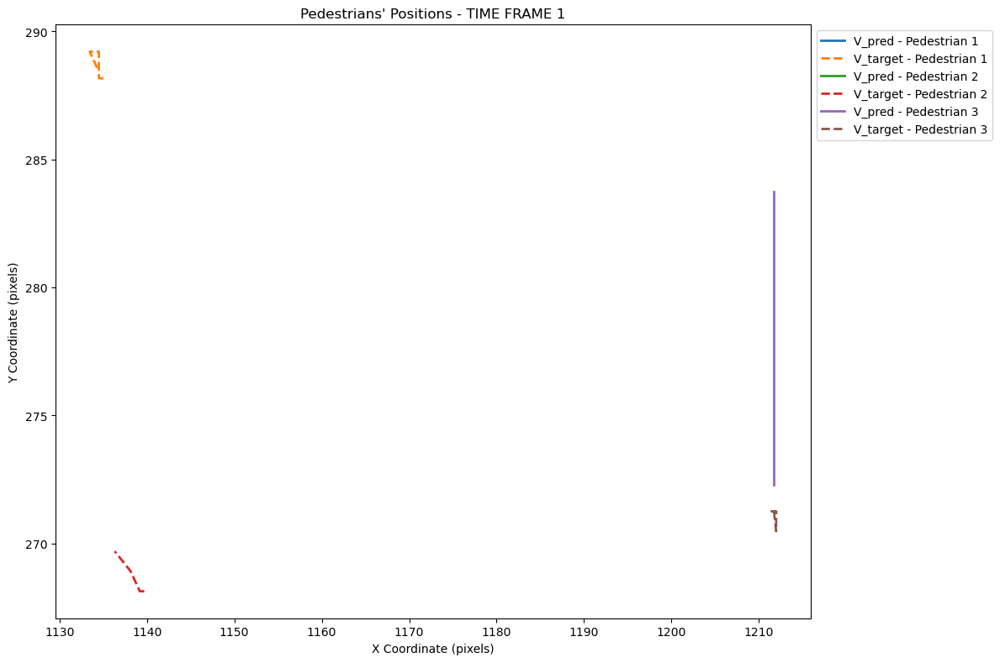

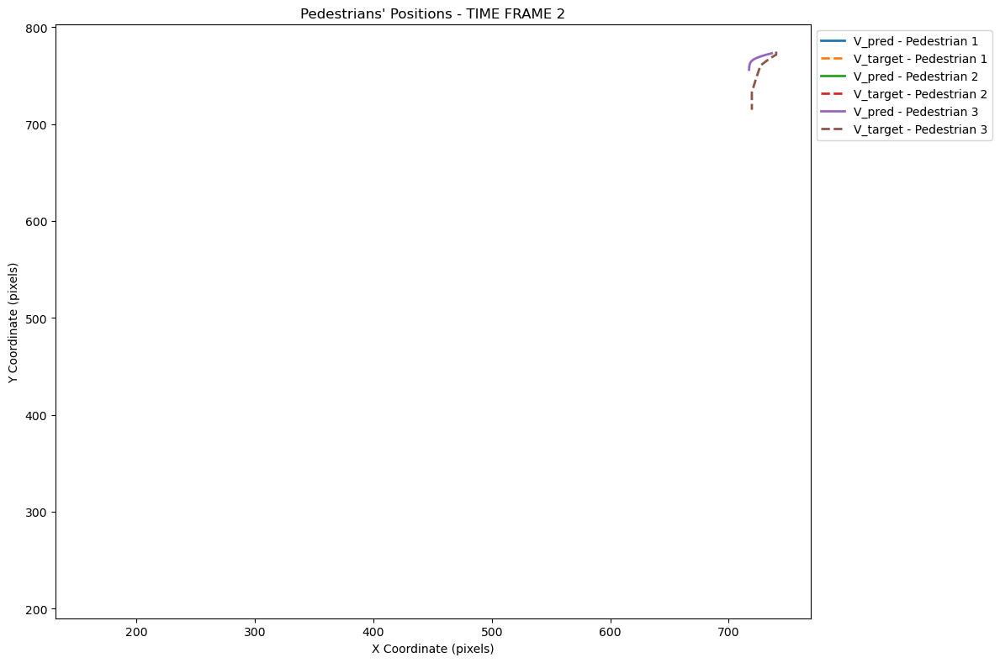

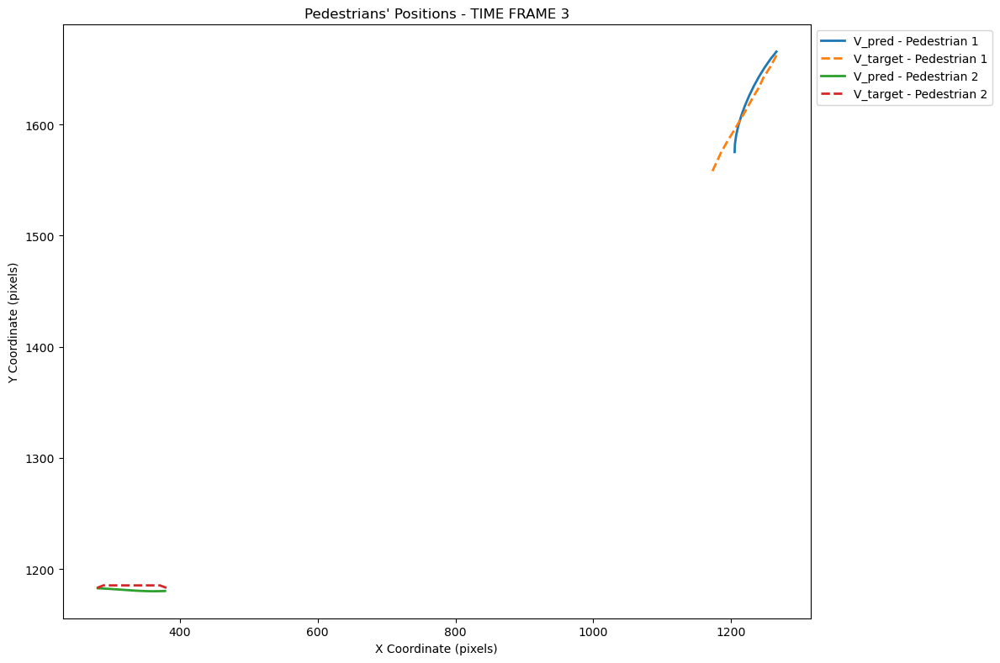

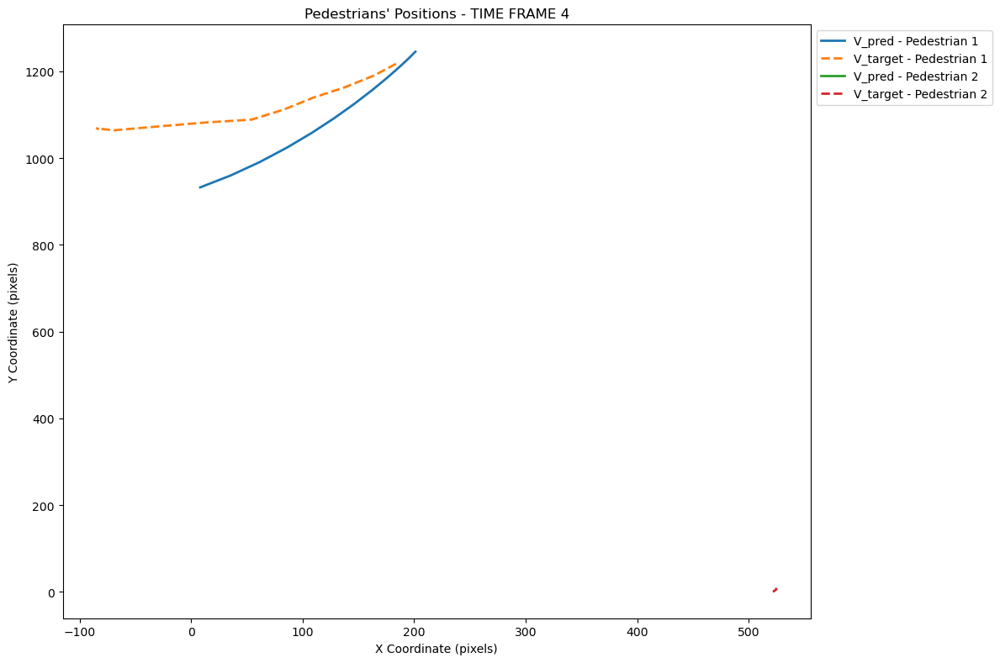

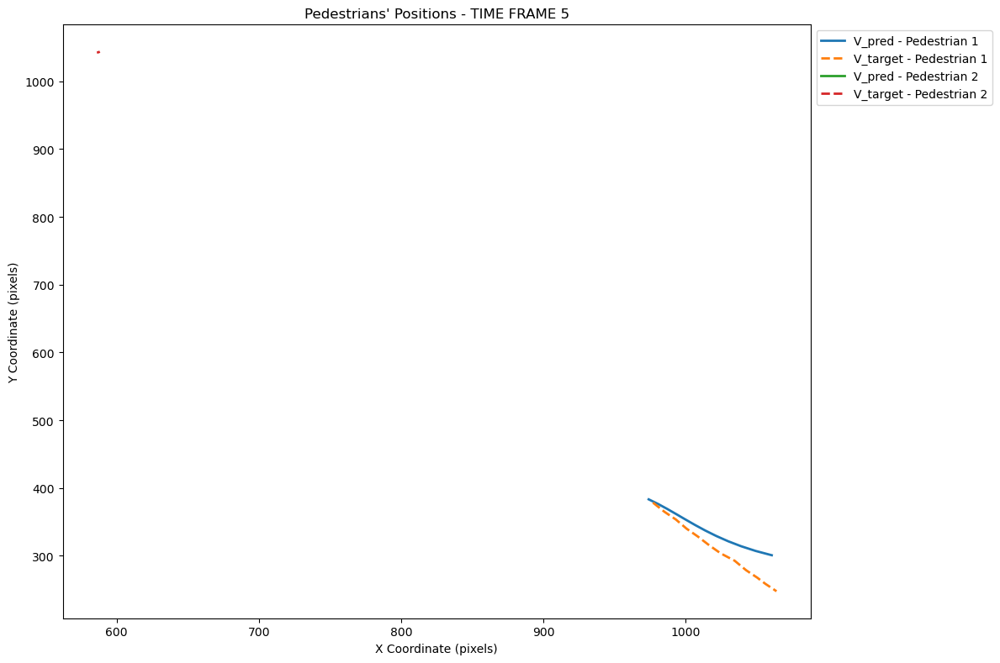

...

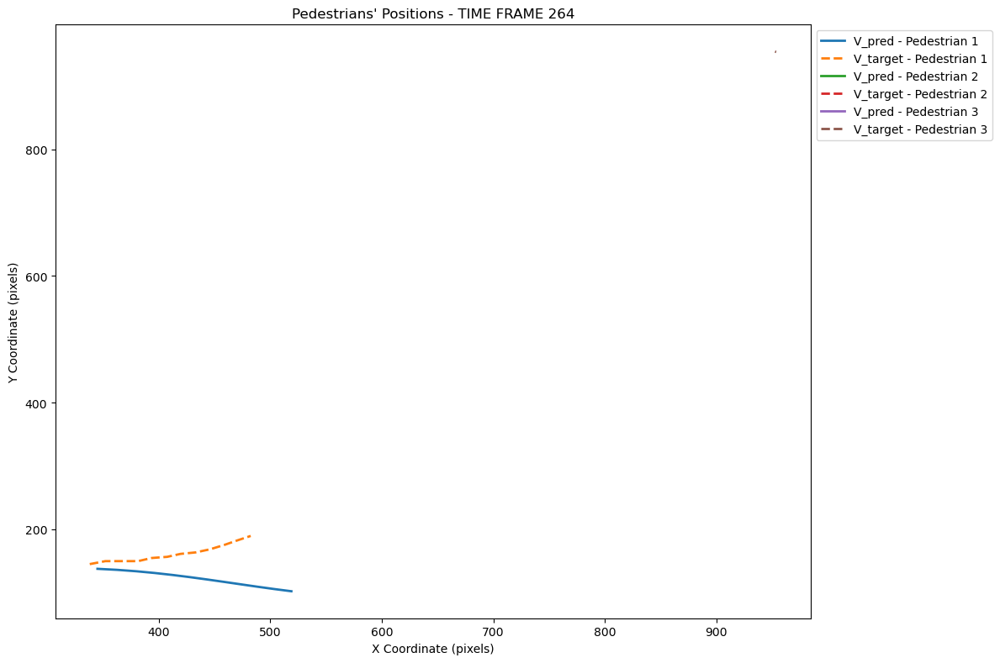

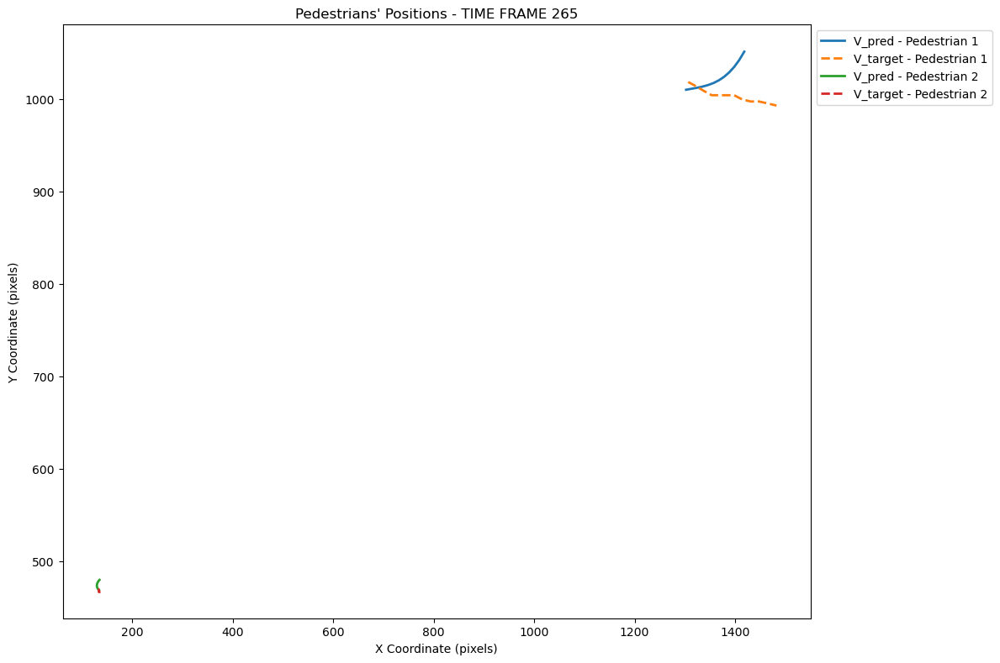

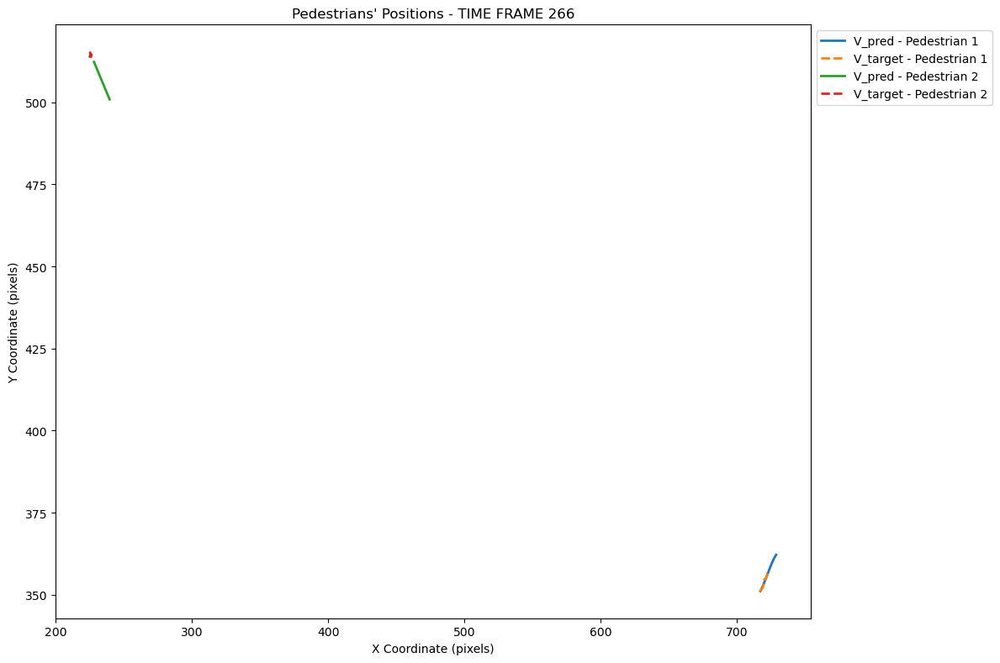

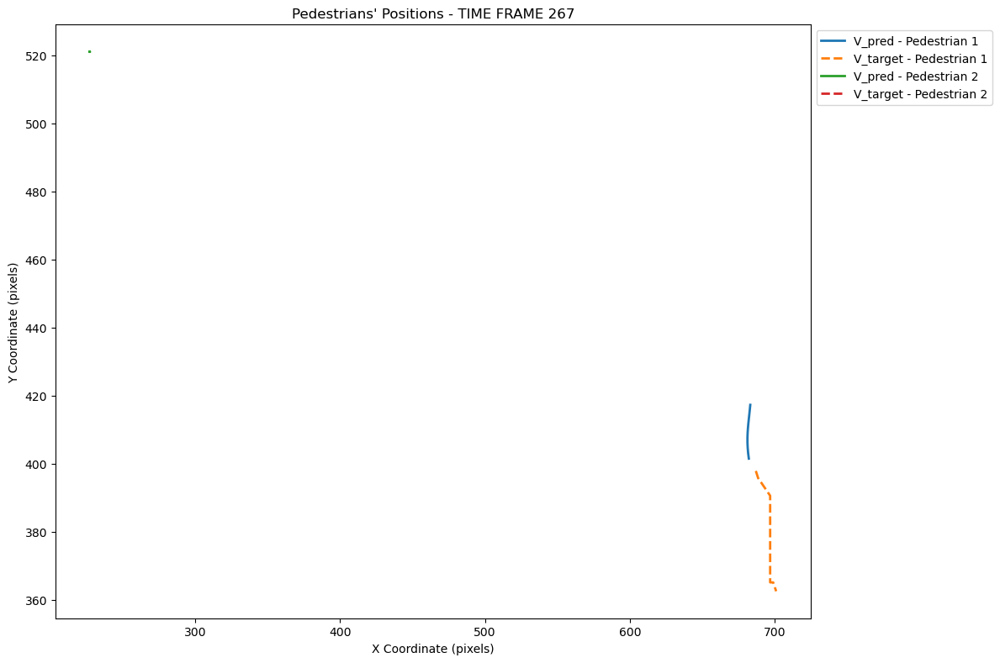

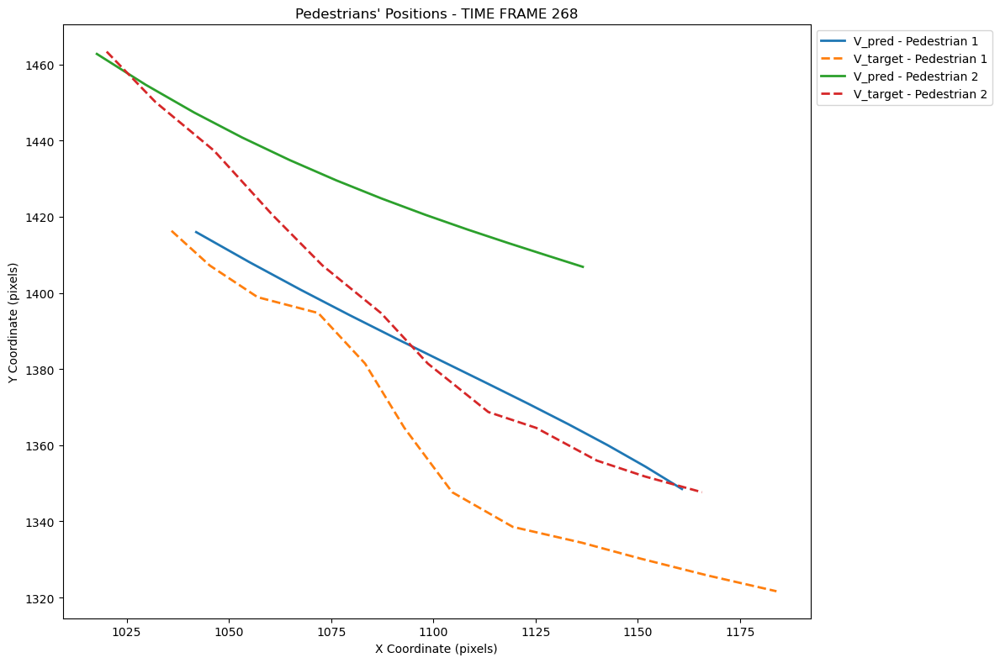

In [17]:
dpi_value = 100

# Create a new figure for each loop iteration
for i in range(1, len(raw_data_dic_.keys()) + 1):
    fig, ax = plt.subplots(figsize=(12, 8), dpi=dpi_value)  # Adjust the figure size and dpi as needed

    # Loop over all pedestrians
    for pedestrian_idx in range(raw_data_dic_[i]['trgt'].shape[1]):
        V_pred_pedestrian = raw_data_dic_[i]['pred'][0][:, pedestrian_idx, :]
        V_target_pedestrian = raw_data_dic_[i]['trgt'][:, pedestrian_idx, :]

        # Plot X and Y coordinates for the selected pedestrian with thicker lines and larger markers
        ax.plot(V_pred_pedestrian[:, 0], V_pred_pedestrian[:, 1], label=f'V_pred - Pedestrian {pedestrian_idx + 1}', linewidth=2)
        ax.plot(V_target_pedestrian[:, 0], V_target_pedestrian[:, 1], linestyle='dashed', label=f'V_target - Pedestrian {pedestrian_idx + 1}', linewidth=2)

    # Set labels and title
    ax.set_xlabel('X Coordinate (pixels)')
    ax.set_ylabel('Y Coordinate (pixels)')
    ax.set_title(f'Pedestrians\' Positions - TIME FRAME {i}')

    # Move the legend outside the plot area to reduce clutter
    ax.legend(loc='upper left', bbox_to_anchor=(1, 1))

    # Adjust layout for better spacing
    plt.tight_layout()

    # Show the plot for this iteration
    plt.show()

In [18]:
# Transform the sdd from meters to pixels with the homognous matrices

In [19]:
import os
import pandas as pd

# Replace 'path_to_files' with the actual path to your text files
path_to_files = '/home/dmasmoudi/Desktop/old/CODE_MASTER_BIVRIATE_GAUSSIAN_STAND/Visualization/DATASET/SDD_WITH_NO_FEATURES_SPLITTED/test/'
text_files = [f for f in os.listdir(path_to_files) if f.endswith('.txt')]

# Initialize an empty list to store data from all files
data_list = []

# Loop through each text file
for file_name in text_files:
    scene_id = os.path.splitext(file_name)[0]  # Extract scene ID from the file name
    with open(os.path.join(path_to_files, file_name), 'r') as file:
        lines = file.readlines()
        for line in lines:
            line = line.strip()  # Remove leading/trailing whitespaces and newline characters
            data_row = line.split('\t')[:4]  # Extract the first 4 columns
            data_row.append(scene_id)  # Append scene ID as a new column
            data_list.append(data_row)

# Create a DataFrame from the collected data
columns = ['frame', 'trackId', 'x', 'y', 'sceneId']  # Adjust column names as needed
df = pd.DataFrame(data_list, columns=columns)
df= df.sort_values(by=['sceneId','trackId'])
# Print the resulting DataFrame
df  #in meters

,frame,trackId,x,y,sceneId
17574,10692.0,189.0,-8.715,-0.921,bookstore_0
17588,10704.0,189.0,-8.331,-0.845,bookstore_0
17615,10716.0,190.0,-7.87,-0.845,bookstore_0
17629,10728.0,190.0,-7.41,-0.845,bookstore_0
17641,10740.0,190.0,-6.968,-0.768,bookstore_0
...,...,...,...,...,...
29046,10944.0,313.0,10.129,15.092,nexus_9
29052,10956.0,313.0,10.219,14.733,nexus_9
29057,10968.0,313.0,10.309,14.374,nexus_9
29062,10980.0,313.0,10.376,13.992,nexus_9


In [20]:
df['frame'] = pd.to_numeric(df['frame'], errors='coerce').astype(pd.Int64Dtype())
df['trackId'] = pd.to_numeric(df['trackId'], errors='coerce').astype(pd.Int64Dtype())
df['x'] = pd.to_numeric(df['x'], errors='coerce')
df['y'] = pd.to_numeric(df['y'], errors='coerce')

In [21]:
def meters_to_pixels(meter_coords, homography_matrix):
    # Add homogeneous coordinate
    meter_coords_homogeneous = np.column_stack((meter_coords, np.ones(len(meter_coords))))

    # Perform transformation
    pixel_coords_homogeneous = np.dot(homography_matrix, meter_coords_homogeneous.T)
    pixel_coords_homogeneous /= pixel_coords_homogeneous[2, :]

    # Extract pixel coordinates
    pixel_coords = pixel_coords_homogeneous[:2, :].T

    return pixel_coords

grouped = df.groupby('sceneId')

for scene_name, group in grouped:
    # Load the homogenous matrix for the scene (replace with your own code)
    homography_matrix = homography_matrices[scene_name]

    # Select rows corresponding to the current scene
    scene_rows = df['sceneId'] == scene_name
    
    transformed_coords = meters_to_pixels(group[['x', 'y']].values, homography_matrix)

    # Assign transformed coordinates to the specific columns directly
    df.loc[scene_rows, 'x'] = transformed_coords[:, 0]
    df.loc[scene_rows, 'y'] = transformed_coords[:, 1]
 #   df[['x', 'y']] = transformed_values_reshaped



In [22]:
df['frame'] = pd.to_numeric(df['frame'], errors='coerce').astype(pd.Int64Dtype())
df['trackId'] = pd.to_numeric(df['trackId'], errors='coerce').astype(pd.Int64Dtype())
df #in pixels

,frame,trackId,x,y,sceneId
17574,10692,189,485.003897,520.019430,bookstore_0
17588,10704,189,495.005748,521.999057,bookstore_0
17615,10716,190,507.013188,521.999066,bookstore_0
17629,10728,190,518.994579,521.999075,bookstore_0
17641,10740,190,530.507115,524.004749,bookstore_0
...,...,...,...,...,...
29046,10944,313,937.500699,879.990527,nexus_9
29052,10956,313,939.504272,871.998179,nexus_9
29057,10968,313,941.507846,864.005832,nexus_9
29062,10980,313,942.999365,855.501439,nexus_9


In [23]:

data=df
def plot_segmentation_maps(image_path,semantic_map):
    semantic_map=semantic_map
  #  print(semantic_map)
   # print(image_path)f
    img= Image.open(image_path)
    semantic_map= Image.open(semantic_map)
  #  print(img)
    mask = np.array(semantic_map)
 #   print(mask)
  #  print(np.array(img).shape)
 #   print(mask.shape)
   # print('number of different classes:' , len( np.unique(semantic_map)))

    # Define a color map for each class
    colors = {
        0:  [0, 0, 0],  # background (class 0)
        1: [0, 255, 0], #green   #pavement  (most interesting for pedestrains)
        2: [0, 128, 128], #teal    # street
        3: [255, 255, 0],#yellow  #building
        4: [255, 192, 203],#pink   #low vegeration
        5: [128, 0, 128],#purple  #Tree
    }

    class_labels = {
      #  0: 'Background',
        1: 'pavement',
        2: 'street',
        3: 'obstacle',
        4: 'lowvegetation',
        5: 'tree',
    }

    # Map each class to its corresponding color
    overlay = np.zeros_like(img)
    patches = []
    for i in range(1,6):  # include background class (0)
        mask_indices = np.where(mask == i)
        overlay[mask_indices] = colors[i]
        patches.append(mpatches.Patch(color=np.array(colors[i])/255.0, label=class_labels[i]))
    return overlay,patches


In [24]:
import torch
from torch.utils.data import DataLoader
import glob
import pickle
from metrics import *
from utils_dali_torch import *
import os
import copy
import argparse
import torch.distributions.multivariate_normal as torchdist
args = argparse.Namespace()
torch.manual_seed(1)
pixel_results=1
current_directory = os.getcwd()
KSTEPS = 20

from model_dali import *
args.input_size = 21 
args.output_size = 5
args.n_stgcnn = 1
args.n_txpcnn = 5
args.kernel_size = 3
args.obs_seq_len = 8
args.pred_seq_len = 12

args.batch_size = 128
args.num_epochs = 250
args.clip_grad = None
def sample_points_on_curve(P0, P1, P2, P3, num_points=12):
    t = torch.linspace(0, 1, num_points).cuda()
    t = t.view(-1, 1)
    t2 = t**2
    t3 = t**3

    sampled_x = P0[0] * (1 - t)**3 + 3 * P1[0] * (1 - t)**2 * t + 3 * P2[0] * (1 - t) * t2 + P3[0] * t3
    sampled_y = P0[1] * (1 - t)**3 + 3 * P1[1] * (1 - t)**2 * t + 3 * P2[1] * (1 - t) * t2 + P3[1] * t3

    return sampled_x, sampled_y
def meters_to_pixels_torch(meter_coords, homography_matrix):
    # Convert numpy arrays to torch tensors
    meter_coords = torch.tensor(meter_coords, dtype=torch.float32).squeeze()


    # Add homogeneous coordinate
    ones_column = torch.ones(meter_coords.shape[0], 1, dtype=torch.float32)
    meter_coords_homogeneous = torch.cat((meter_coords, ones_column), dim=1)

    # Perform transformation
    pixel_coords_homogeneous = torch.matmul(homography_matrix, meter_coords_homogeneous.t())
    pixel_coords_homogeneous /= pixel_coords_homogeneous[2, :].clone().detach()  # Use clone() to create a copy

    # Extract pixel coordinates
    pixel_coords = pixel_coords_homogeneous[:2, :].t()

    return pixel_coords.unsqueeze(1)
def test(KSTEPS=20):
    global loader_test,model
    model.eval()

    pred_visual = []
    targets_visual = []
    
    ade_bigls = []
    fde_bigls = []
    raw_data_dict = {}
    step =0 
    for batch in loader_test: 
        step+=1
        #Get data
        batch = [tensor.cuda() for tensor in batch]
        obs_traj, pred_traj_gt, obs_traj_rel, pred_traj_gt_rel, non_linear_ped,\
         loss_mask,V_obs,A_obs,V_tr,A_tr = batch
        V_obs_tmp =V_obs.permute(0,3,1,2)

        V_pred,_ = model(V_obs_tmp,A_obs.squeeze())

        V_tr = V_tr.squeeze()
        V_pred = V_pred.squeeze()
        num_of_objs = obs_traj_rel.shape[1]
        V_pred,V_tr =  V_pred[:,:num_of_objs,:],V_tr[:,:num_of_objs,:]
        sx = torch.nn.functional.softplus(V_pred[:,:,2]) #sx
        sy = torch.nn.functional.softplus(V_pred[:,:,3]) #sy
        corr = (2 / torch.pi) * torch.atan(V_pred[:, :, 4])#corr
        cov = torch.zeros(V_pred.shape[0],V_pred.shape[1],2,2).cuda()
        cov[:,:,0,0]= sx*sx
        cov[:,:,0,1]= corr*sx*sy
        cov[:,:,1,0]= corr*sx*sy
        cov[:,:,1,1]= sy*sy
        mean = V_pred[:,:,0:2]       

        mvnormal = torchdist.MultivariateNormal(mean,cov)

        ade_ls = {}
        fde_ls = {}
  
        V_x = seq_to_nodes(obs_traj.data.cpu().numpy().copy())             
        V_x_rel_to_abs = nodes_rel_to_nodes_abs(V_obs.data.cpu().numpy().squeeze().copy(),
                                                 V_x[0,:,:].copy())

        V_y = seq_to_nodes(pred_traj_gt.data.cpu().numpy().copy())
        V_y_rel_to_abs = nodes_rel_to_nodes_abs(V_tr.data.cpu().numpy().squeeze().copy(),
                                                 V_x[-1,:,:].copy())
        
        raw_data_dict[step] = {}
        raw_data_dict[step]['obs'] = copy.deepcopy(V_x_rel_to_abs)
        V_target= copy.deepcopy(V_y_rel_to_abs)
        raw_data_dict[step]['trgt'] = []
    
        raw_data_dict[step]['pred'] = []

        for n in range(num_of_objs):
            ade_ls[n]=[]
            fde_ls[n]=[]

        best_data_dict_in_20_steps = []
        for k in range(KSTEPS):
            

            V_pred = mvnormal.sample()
            V_pred_rel_to_abs = nodes_rel_to_nodes_abs(V_pred.data.cpu().numpy().squeeze().copy(),
                                                     V_x[-1,:,:].copy())
            
          #  best_data_dict_in_20_steps.append()
            number_of = []
  
            if 1:
                    for n in range(num_of_objs):
                            pred = []
                            target = []
                            obsrvs = []
                            number_of = []

                            homography_matrix = torch.tensor(homography_matrices[scene_env], dtype=torch.float32).clone().detach()
                           # print(V_pred_rel_to_abs.shape)
                            V_pred_ped=V_pred_rel_to_abs[:,n:n+1,:].squeeze()

                            predicted_bezier_points = V_pred_ped

                            P0=(obs_traj.permute(0, 3, 1, 2).squeeze())[-1, n:n + 1, :2].squeeze().cuda()

                            P1 = predicted_bezier_points[3]
                            P2 = predicted_bezier_points[7]
                            P3 = predicted_bezier_points[-1]
                            sampled_x, sampled_y = sample_points_on_curve(P0, P1, P2, P3, num_points=args.pred_seq_len+1)
                            bezier_curve_points = torch.stack([sampled_x, sampled_y], dim=-1)
                            bezier_curve_points_cpu = bezier_curve_points.detach().cpu().numpy()
      


                            pred.append(meters_to_pixels_torch(bezier_curve_points_cpu[1:,:,:],homography_matrix ))
                            target.append(meters_to_pixels_torch(V_y_rel_to_abs[:, n:n + 1, :],homography_matrix ))
                            obsrvs.append((V_x_rel_to_abs[:, n:n + 1, :]))
                            number_of.append(1)
                    
                            ade_ls[n].append(ade(pred, target, number_of))
                            fde_ls[n].append(fde(pred, target, number_of))
                            V_pred_rel_to_abs[:,n:n+1,:]=meters_to_pixels_torch(bezier_curve_points_cpu[1:,:,:],homography_matrix )
                            V_target[:, n:n + 1, :]=meters_to_pixels_torch(V_y_rel_to_abs[:, n:n + 1, :],homography_matrix )
                    best_data_dict_in_20_steps.append(copy.deepcopy(V_pred_rel_to_abs))
                    
                    
                    raw_data_dict[step]['trgt'] = copy.deepcopy(V_target)
                    
                    
        best_data_for_one_scene=best_data_dict_in_20_steps[ade_ls[n].index(min(ade_ls[n]))]
      #  print(best_data_for_one_scene)
        raw_data_dict[step]['pred'].append(copy.deepcopy(best_data_for_one_scene))

        for n in range(num_of_objs):
            ade_bigls.append(min(ade_ls[n]))
            fde_bigls.append(min(fde_ls[n]))

    ade_ = sum(ade_bigls)/len(ade_bigls)
    fde_ = sum(fde_bigls)/len(fde_bigls)
    return ade_,fde_,raw_data_dict,step



In [27]:
import os
import numpy as np
from matplotlib.animation import FFMpegWriter
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from PIL import Image
import pickle
from ipywidgets import interact, widgets
from IPython.display import display, HTML
global unique
import random
# Load your data
global unique
unique = []
global scene_env
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 60
def animate_all_trajectories(ax, fig, trajectory_data, interval_ms=100):
    ax.axis('off')
    sc = ax.scatter([], [], s=30, c=[], cmap='viridis')  # Increase scatter point size and use 'viridis' colormap

    legend_added = False
    scatter_data = []

    # Create the legend for trajectory animation
    handles_anim = [
        mpatches.Patch(color='red', label='Observation'),
        mpatches.Patch(color='blue', label='Ground Truth'),
        mpatches.Patch(color='orange', label='GCNN')
    ]
    legend_anim = ax.legend(handles=handles_anim, bbox_to_anchor=(1.05, 0), loc='best')

    def init():
        sc.set_offsets(np.column_stack(([], [])))
        return sc,

    def update(frame):
        nonlocal legend_added
        nonlocal scatter_data

        if frame <= 8:
            x_frames = trajectory_data[:frame + 1, :, 0].flatten().astype(float)
            y_frames = trajectory_data[:frame + 1, :, 1].flatten().astype(float)
            color = ['red'] * (frame + 1) * trajectory_data.shape[0]
        elif frame >= 8 and frame <= 20:
            x_frames = trajectory_data[8:frame + 1, :, 0].flatten().astype(float)
            y_frames = trajectory_data[8:frame + 1, :, 1].flatten().astype(float)
            color = ['blue'] * (frame + 1 - 8) * trajectory_data.shape[0]
        elif frame >= 21:
            x_frames = trajectory_data[21:frame + 1, :, 0].flatten().astype(float)
            y_frames = trajectory_data[21:frame + 1, :, 1].flatten().astype(float)
            color = ['orange'] * (frame + 1 - 21) * trajectory_data.shape[0]

        frame_data = list(zip(x_frames, y_frames, color))
        scatter_data.extend(frame_data)

        scatter_data_arr = np.array(scatter_data, dtype=object)

        sc.set_offsets(scatter_data_arr[:, :2].astype(float))
        sc.set_color(scatter_data_arr[:, 2])

        if not legend_added and len(x_frames) >= 12:
            legend_added = True

        return sc, legend_anim

    frames = trajectory_data.shape[0]
    anim = animation.FuncAnimation(
        fig, update, init_func=init, frames=frames, blit=False, interval=interval_ms,
        repeat=False  # Animation will not loop
    )
    plt.close()  # Prevents double display in IPython notebook
    return anim, legend_anim



def show_image(folder_path, image_name, mode, mode_widget):
    global scene_env
   # print(scene_env)
    image_path = os.path.join(folder_path, image_name)
    img = Image.open(image_path)

    # Get the scene environment name
    scene_env = os.path.basename(os.path.dirname(image_path))
    try:
        data_set=current_directory+'/DATASET/TESTING/'
       # print(scene_env)
        global loader_test,model
        dset_test = TrajectoryDataset(
                data_set + scene_env+'/',
                obs_len=args.obs_seq_len,
                pred_len=args.pred_seq_len,
                skip=1, norm_lap_matr=True)
     
        loader_test = DataLoader(
                dset_test,
                batch_size=1,  # This is irrelevant to the args batch size parameter
                shuffle=True,
                num_workers=1)
        seed = 2
        torch.manual_seed(seed)
        np.random.seed(seed)
        random.seed(seed)
        
        ad, fd, raw_data_dic_,step= test()
  

        

 

        for i in range(1, step+1):
            for j in range(raw_data_dic_[i]['obs'].shape[1]):
                raw_data_dic_[i]['obs'][:, j, :2] = meters_to_pixels(raw_data_dic_[i]['obs'][:, j, :2], homography_matrices[scene_env])
       # print( raw_data_dic_[1]['obs'])
        #print(type(raw_data_dic_[i]['obs']))
       # print(type(raw_data_dic_[i]['pred']))
        stacked_arrays = []

       # print(len(raw_data_dic_))
        for i in range(1, len(raw_data_dic_)+1):
            stacked_arrays.append(np.concatenate((
                raw_data_dic_[i]['obs'][:,:,:2],
                raw_data_dic_[i]['trgt'],
                raw_data_dic_[i]['pred'][0]
            ), axis=0))
        #print(len(stacked_arrays))
        mode_widget.options =  list(map(str, np.arange(0, len(stacked_arrays))))
        
        max_shape_index = None
        max_shape_size = 0

        for i, array in enumerate(stacked_arrays):
                    if array.shape[1] > max_shape_size:
                        max_shape_size = array.shape[1]
                        max_shape_index = i
        
        

        print("Index of the element with the biggest number pedestrains:", max_shape_index)
        print("Biggest number of pedestrains that were prediced simultanoulsly:", max_shape_size)
     
        
    except:
        mode_widget.options = ['Plot Scene'] 
        print('Not enough frames in this scene! Please choose another one!')

    semantic_map = os.path.join(parent_directory+'/DATASET/SDD_semantic_maps/train_masks', f"{scene_env}_mask.png")
    
    # Call the plot_segmentation_maps function to generate the overlay and patches
    overlay, patches = plot_segmentation_maps(image_path, semantic_map)

    # Create a figure and add the image and overlay to it


    
    
    
  
    
    
   # mode_widget.options=unique
    #print(unique)
    
#    grouped_data =  scene_data.groupby('trackId')


   # selected_rows = grouped_data.head(5)
    
    
    
    if mode=='Plot Scene':
        fig, ax = plt.subplots(figsize=(15, 10), dpi=100)
        ax.imshow(img)
        ax.imshow(overlay, alpha=0.5)
        ax.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='best')
       # plt.show()
        #plt.close(fig)

        
      
    else:
             #  mode_widget.options = ['Plot Scene'] + list(map(str, np.arange(1, len(stacked_arrays)+1)))
           #     plt.close()
        
        



                fig, ax = plt.subplots(figsize=(15, 10), dpi=100)
                ax.imshow(img)
                ax.imshow(overlay, alpha=0.5)
                ax.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='best')
                print('*'*70)
                print('The trajectories of ',stacked_arrays[int(mode)].shape[1], ' pedestrians are being simultanoulsly predicted!')
                print('*'*70)
                anim, anim_legend = animate_all_trajectories(ax, fig, stacked_arrays[int(mode)],interval_ms=50)
         
                ax.legend(handles=patches, bbox_to_anchor=(1.05, 1), loc='best')
                ax.add_artist(anim_legend) 


               # anim = animation.FuncAnimation(fig, update_animation, frames=num_frames, interval=50, repeat=True)

                # Display the animation inline in the Jupyter Notebook
               # display(HTML(anim.to_jshtml()))
                

             #   # Specify the path for saving the animation as an MP4 video
                display(HTML(anim.to_jshtml()))
                
 
              
                gif_save_path = f"animation_{mode}.gif"
                
          
              
          
                anim.save(gif_save_path, writer='pillow', fps=30)

                # Close the figure and clear any resources
                plt.close(fig)





    



def select_image(folder_path):
    global unique
    image_names = []
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if file.endswith(".jpg") or file.endswith(".png"):
                image_names.append((os.path.relpath(os.path.join(root, file), folder_path)))
  
    # Create dropdown widgets for image selection and visualization mode selection
    image_widget = widgets.Dropdown(options=image_names, description='Select env:', layout={'width': 'max-content'})
  #  print(unique)
    #mode_widget = widgets.Dropdown(options=list(map(str, unique)), description='Visualization mode:', layout={'width': 'max-content
   # image_widget = widgets.Dropdown(options=[name.replace('/reference.jpg', '') for name in image_names], description='Select image:', layout={'width': 'max-content'})
    mode_widget = widgets.Dropdown(options=['Plot Scene'] ,description='# scene:')
    # Create a function to pass the image name and visualization mode to the show_image function
    def f(image_name, mode):

        show_image(folder_path, image_name, mode, mode_widget)
        plt.ioff()
        plt.close()


    # Call the display function to display the widgets
    display(interact(f, image_name=image_widget, mode=mode_widget))
    plt.ioff()
    plt.close()

# Specify the path to the folder containing the images
folder_path = parent_directory + '/DATASET/SDD/train/'

# Call the select_image function with the folder_path argument
select_image(folder_path)
plt.close()

interactive(children=(Dropdown(description='Select env:', layout=Layout(width='max-content'), options=('nexus_…

<function __main__.select_image.<locals>.f(image_name, mode)>

In [ ]:
#best examples death circle_0  index 1 , pedestrain getting away from obstcale